#### GBM image post-processing
##### 1st May 2023
##### 2nd May ; plots as subplots (red dots), create typing class, 
##### 3rd May : updated both the typing classes, generated one set of figures for 1st image
##### 8th May : cleaned the plots

In [24]:
import numpy as np
import pandas as pd
import scipy.integrate
import math
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from matplotlib import animation, rc
from IPython.display import HTML
import time
import multiprocessing as mp
import os

from scipy.stats import zscore

from sklearn.manifold import TSNE
from sklearn.mixture import BayesianGaussianMixture

import phenograph as pg
import random

from matplotlib.lines import Line2D

In [2]:
colours_30 = ["red","gold","royalblue","green","dimgray","orchid","darkviolet",
              "firebrick", "orange", "limegreen", "blue", "purple", "seagreen","gold","darkolivegreen",
              "lightpink","thistle"]
colours_31 = ["cadetblue","saddlebrown","slategrey","powderblue",
            "palevioletred","mediumvioletred","yellowgreen","lemonchiffon","chocolate",
              "lightsalmon","lightcyan","lightblue", "darkorange","magenta","sienna","midnightblue","tomato","tomato","aqua",
             "darkslategray","coral","lightcoral","sandybrown","indianred","olivedrab","darkgreen","blueviolet","forestgreen","darkred",
             "dimgray","teal","mistyrose"]

In [3]:
### the Typing classification 
amp_code = -1
def genotyping(r1):

    ##genotype 
    if ((count_matrix[r1,3] <6) and (count_matrix[r1,4] <6) and (count_matrix[r1,5] <6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 0 #no amp

    elif ((count_matrix[r1,3] <6) and (count_matrix[r1,4] <6) and (count_matrix[r1,5] >=6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 1 #pdgfra amp

    elif ((count_matrix[r1,3] <6) and (count_matrix[r1,4] >= 6) and (count_matrix[r1,5] < 6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 2 #egfr amp

    elif ((count_matrix[r1,3] <6) and (count_matrix[r1,4] >=6) and (count_matrix[r1,5] >=6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 3 #egfr + pdgfra amp

    elif ((count_matrix[r1,3] >=6) and (count_matrix[r1,4] <6) and (count_matrix[r1,5] <6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 4 # cdk4 amp

    elif ((count_matrix[r1,3] >=6) and (count_matrix[r1,4] <6) and (count_matrix[r1,5] >=6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 5 #cdk4 + pdgfra amp

    elif ((count_matrix[r1,3] >=6) and (count_matrix[r1,4] >=6) and (count_matrix[r1,5] <6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 6 #cdk4 + egfr amp

    elif ((count_matrix[r1,3] >=6) and (count_matrix[r1,4] >=6) and (count_matrix[r1,5] >=6) and ((count_matrix[r1,9] <7) or (count_matrix[r1,10] <7) or (count_matrix[r1,11] <7) )):
        amp_code = 7 #all amp

    elif ((count_matrix[r1,3] <6) and (count_matrix[r1,4] <6) and (count_matrix[r1,5] <6) and ((count_matrix[r1,9] >=7) or (count_matrix[r1,10] >=7) or (count_matrix[r1,11] >=7) )):
        amp_code = 8 #equivocal amp (per probe)
    
    return(amp_code)

geno_labels=['No amp','PDGFRA amp','EGFR amp','PDGFRA + EGFR amp','CDK4 amp','CDK4 + PDGFRA amp',
             'CDK4 + EGFR amp','CDK4 + EGFR +PDGFRA amp','Equivocal']

In [4]:
# phenotyping

cell_type_code = -2
def phenotyping(r1, amp_code):
    if ((amp_code ==0) and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]==0)):
        cell_type_code = 0 # no signal
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]>0)):
        cell_type_code = 1 # hypoxic cell
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]==0)):
        cell_type_code = 2 # immune cell
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]>0)):
        cell_type_code = 3 # hypoxic immune cell
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]==0)):
        cell_type_code = 4 # endothelial cell
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]>0)):
        cell_type_code = 5 # hypoxic endothelial cell
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]==0)):
        cell_type_code = 6 # immune cell
    elif (amp_code ==0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]>0)):
        cell_type_code = 7 # hypoxic immune
        
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]==0)):
        cell_type_code = 8 # TERT mutant GBM cell
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]>0)):
        cell_type_code = 9 # Hypoxic TERT mutant GBM cell
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]==0)):
        cell_type_code = 16 # NA
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]>0)):
        cell_type_code = 16 # NA
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]==0)):
        cell_type_code = 10 # TERT mutant GBM cell, EC mimicry
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]>0)):
        cell_type_code = 11 # Hypoxic TERT mutant GBM cell, EC mimicry
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]==0)):
        cell_type_code = 16 # NA
    elif ( (count_matrix[r1,6]>0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]>0)):
        cell_type_code = 16 # NA
        
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]==0)):
        cell_type_code = 12 # GBM cell, C228T wt
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]>0)):
        cell_type_code = 13 # Hypoxic GBM cell, C228T wt    
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]==0)):
        cell_type_code = 16 # NA
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]==0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]>0)):
        cell_type_code = 16 # NA
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]==0)):
        cell_type_code = 14 # GBM cell, C228T wt, EC mimicry
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]==0) and (count_matrix[r1,14]>0)):
        cell_type_code = 15 # Hypoxic GBM cell, C228T wt, EC mimicry
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]==0)):
        cell_type_code = 16 # NA
    elif (amp_code >0 and (count_matrix[r1,6]==0) and (count_matrix[r1,12]>0) and (count_matrix[r1,13]>0) and (count_matrix[r1,14]>0)):
        cell_type_code = 16 # NA
    return(cell_type_code)


pheno_labels = ['No signal','Hypoxic','Immune','Hypoxic immune','Endothelial','Hypoxic Endothelial',
                  'Immune','Hypoxic immune','TERT mutant GBM','Hypoxic TERT mutant GBM',
                  'TERT mutant GBM, EC mimicry','Hypoxic TERT mutant GBM, EC mimicry',
                  'GBM cell, C228T wt','Hypoxic GBM cell, C228T wt',
                  'GBM cell, C228T wt, EC mimicry','Hypoxic GBM cell, C228T wt, EC mimicry',
                  'NA']

In [5]:
len(pheno_labels)

17

In [6]:
data_path = '/Users/4470526/Downloads/Projects/GBM_SCRIPPS/ImageAnalysis_Moffitt_Complete/'
name = 'CM_Case01PrimA1_Broad'
count_matrix =  np.array(pd.read_csv(os.path.join(data_path+name+'.csv'), header=0,index_col=None)) #combined since it  has both pre and during data

In [7]:
count_matrix.shape

(723, 15)

In [8]:
count_matrix[0,:]

array([1.00000000e+00, 1.00000000e+00, 8.10000000e+02, 1.20000000e+01,
       1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 6.74595062e+02,
       1.77580247e+01, 2.46913580e-01, 1.23456790e-01,            nan,
       0.00000000e+00, 0.00000000e+00, 2.00000000e+00])

In [9]:
## replace nan with 0
count_matrix[np.isnan(count_matrix)] = 0

In [10]:
im_num, count_im_num = np.unique(count_matrix[:,0],return_counts=True)

In [11]:
im_num

array([1., 2., 3., 4., 5.])

In [12]:
count_im_num

array([143, 113, 141, 178, 148])

In [15]:
np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)

array([[11., 12., 12., 10., 15., 15., 16., 18., 15., 12.,  1., 14., 16.,
        19., 10., 16., 14., 15.,  9., 14., 23., 12.,  9., 15., 11., 14.,
        16., 17., 10., 10.,  9., 13., 14., 12., 20., 16., 10., 12., 18.,
         1., 14.,  9., 16., 21., 11., 18., 16., 16., 11., 15., 16., 11.,
        15., 17., 14., 15., 14., 12., 12., 15., 16., 20., 13., 11., 12.,
        14., 13., 13., 14., 19., 15., 13., 15., 19., 14., 10.,  8., 13.,
        14., 13., 10., 15., 17., 10., 12., 14., 17., 13., 12., 13., 17.,
        10., 18., 10., 15., 15., 17., 16., 14., 11.,  8., 13., 10., 13.,
        13., 16., 10., 15., 12., 12., 13., 16., 16., 15., 13., 12., 20.,
        11., 13., 18., 16., 13., 21.,  1., 20.,  9., 13., 10., 19., 12.,
        13., 15., 16., 16., 10., 14., 15., 13., 19., 14., 14., 11., 11.,
        16., 14., 15., 16., 13.]])

In [16]:
## make it a subplot

columns = 3
rows = 2

'''
fig=plt.figure(figsize=(5,3),dpi=500)
for i in range(1,6):
    #plt.figure(i)
    print(i)
    fig.add_subplot(rows, columns, i)
    plt.scatter(X_2d[:,0], X_2d[:,1], c=scaled_X[:,y_marker_pins[i-1]],   s=0.5,linewidths=0, cmap=cmap1)
    plt.axis('off')
    plt.title(y_marker[i-1],fontsize='x-small')
#plt.colorbar()
'''

fig = plt.figure(figsize=(12,12),dpi=750)
for im in im_num:
    print(im)
    ii = np.int64(im)
    fig.add_subplot(rows, columns, ii)
    
    #for cells in range(count_im_num[np.int(im)-1]):
    #print(cells)
    s1 = np.where(np.array(count_matrix[:,0])==im)
    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color='red',s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*3,linewidths=0,alpha=0.8)
    plt.axis('on')
plt.savefig('image1.png')

1.0
2.0
3.0
4.0
5.0


In [ ]:
geno_list = []
pheno_list = []
for r1 in range(count_matrix.shape[0]):
    print('row',r1)
    ac = genotyping(r1)
    print(ac)
    geno_list.append(ac) 
    ct = phenotyping(r1,ac)
    print(ct)
    pheno_list.append(ct)
    

In [493]:
### plot the images with both genotype and phenotype info

In [494]:
np.array(geno_list)[s1]

array([0, 0, 0, 0, 4, 4, 6, 6, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 6, 0,
       0, 4, 6, 6, 1, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 4, 6, 0, 6, 0, 0, 0, 0, 6, 0, 4, 4, 0, 0, 4, 0, 4, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 6, 0, 0, 4, 0, 0,
       6, 0, 0, 0, 0, 0, 4, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 6, 0,
       0, 0, 0, 0, 0, 0, 6, 0, 6, 6, 0, 0, 0, 0, 2, 0, 2, 4, 0, 0, 0, 0,
       0, 2, 0, 4, 4, 0, 0, 2, 0, 4, 0, 0, 0, 0, 0, 0])

In [18]:
'''
## make it a subplot

columns = 2
rows = 3


fig = plt.figure(figsize=(10,12),dpi=750)
for im in im_num:
    print(im)
    ii = np.int64(im)
    fig.add_subplot(rows, columns, ii)
    
    #for cells in range(count_im_num[np.int(im)-1]):
    #print(cells)
    s1 = np.where(np.array(count_matrix[:,0])==im)
    geno_colr = np.array(geno_list)[s1]
    #color_s1 = colours_30
    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colours_30)[geno_colr],s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4,linewidths=0,alpha=0.8)
    plt.axis('on')
    plt.title('Image '+ str(np.int64(im)))
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig('genotype1.png')
'''

"\n## make it a subplot\n\ncolumns = 2\nrows = 3\n\n\nfig = plt.figure(figsize=(10,12),dpi=750)\nfor im in im_num:\n    print(im)\n    ii = np.int64(im)\n    fig.add_subplot(rows, columns, ii)\n    \n    #for cells in range(count_im_num[np.int(im)-1]):\n    #print(cells)\n    s1 = np.where(np.array(count_matrix[:,0])==im)\n    geno_colr = np.array(geno_list)[s1]\n    #color_s1 = colours_30\n    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colours_30)[geno_colr],s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4,linewidths=0,alpha=0.8)\n    plt.axis('on')\n    plt.title('Image '+ str(np.int64(im)))\n#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)\nplt.savefig('genotype1.png')\n"

In [19]:
'''
## make it a subplot

columns = 2
rows = 3


fig = plt.figure(figsize=(10,12),dpi=750)
for im in im_num:
    print(im)
    ii = np.int64(im)
    fig.add_subplot(rows, columns, ii)
    
    #for cells in range(count_im_num[np.int(im)-1]):
    #print(cells)
    s1 = np.where(np.array(count_matrix[:,0])==im)
    geno_colr = np.array(geno_list)[s1]
    #color_s1 = colours_30
    plt.hist(geno_colr)#,color=np.array(colours_30)[geno_colr]) #scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colours_30)[geno_colr],s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4,linewidths=0,alpha=0.8)
    plt.axis('on')
    plt.title('Image '+ str(np.int64(im)))
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig('genotype1_stats.png')
'''

"\n## make it a subplot\n\ncolumns = 2\nrows = 3\n\n\nfig = plt.figure(figsize=(10,12),dpi=750)\nfor im in im_num:\n    print(im)\n    ii = np.int64(im)\n    fig.add_subplot(rows, columns, ii)\n    \n    #for cells in range(count_im_num[np.int(im)-1]):\n    #print(cells)\n    s1 = np.where(np.array(count_matrix[:,0])==im)\n    geno_colr = np.array(geno_list)[s1]\n    #color_s1 = colours_30\n    plt.hist(geno_colr)#,color=np.array(colours_30)[geno_colr]) #scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colours_30)[geno_colr],s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4,linewidths=0,alpha=0.8)\n    plt.axis('on')\n    plt.title('Image '+ str(np.int64(im)))\n#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)\nplt.savefig('genotype1_stats.png')\n"

In [20]:
'''
## make it a subplot

columns = 2
rows = 3


fig = plt.figure(figsize=(10,12),dpi=750)
for im in im_num:
    print(im)
    ii = np.int64(im)
    fig.add_subplot(rows, columns, ii)
    
    #for cells in range(count_im_num[np.int(im)-1]):
    #print(cells)
    s1 = np.where(np.array(count_matrix[:,0])==im)
    pheno_colr = np.array(pheno_list)[s1]
    #color_s1 = colours_30
    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colours_31)[pheno_colr],s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4,linewidths=0,alpha=0.8)
    plt.axis('on')
    plt.title('Image '+ str(np.int64(im)))
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig('phenotype1.png')
'''

"\n## make it a subplot\n\ncolumns = 2\nrows = 3\n\n\nfig = plt.figure(figsize=(10,12),dpi=750)\nfor im in im_num:\n    print(im)\n    ii = np.int64(im)\n    fig.add_subplot(rows, columns, ii)\n    \n    #for cells in range(count_im_num[np.int(im)-1]):\n    #print(cells)\n    s1 = np.where(np.array(count_matrix[:,0])==im)\n    pheno_colr = np.array(pheno_list)[s1]\n    #color_s1 = colours_30\n    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colours_31)[pheno_colr],s=np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4,linewidths=0,alpha=0.8)\n    plt.axis('on')\n    plt.title('Image '+ str(np.int64(im)))\n#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)\nplt.savefig('phenotype1.png')\n"

In [21]:
pheno_labels

['No signal',
 'Hypoxic',
 'Immune',
 'Hypoxic immune',
 'Endothelial',
 'Hypoxic Endothelial',
 'Immune',
 'Hypoxic immune',
 'TERT mutant GBM',
 'Hypoxic TERT mutant GBM',
 'TERT mutant GBM, EC mimicry',
 'Hypoxic TERT mutant GBM, EC mimicry',
 'GBM cell, C228T wt',
 'Hypoxic GBM cell, C228T wt',
 'GBM cell, C228T wt, EC mimicry',
 'Hypoxic GBM cell, C228T wt, EC mimicry',
 'NA']

In [22]:
geno_labels

['No amp',
 'PDGFRA amp',
 'EGFR amp',
 'PDGFRA + EGFR amp',
 'CDK4 amp',
 'CDK4 + PDGFRA amp',
 'CDK4 + EGFR amp',
 'CDK4 + EGFR +PDGFRA amp',
 'Equivocal']

1.0
2.0
3.0
4.0
5.0


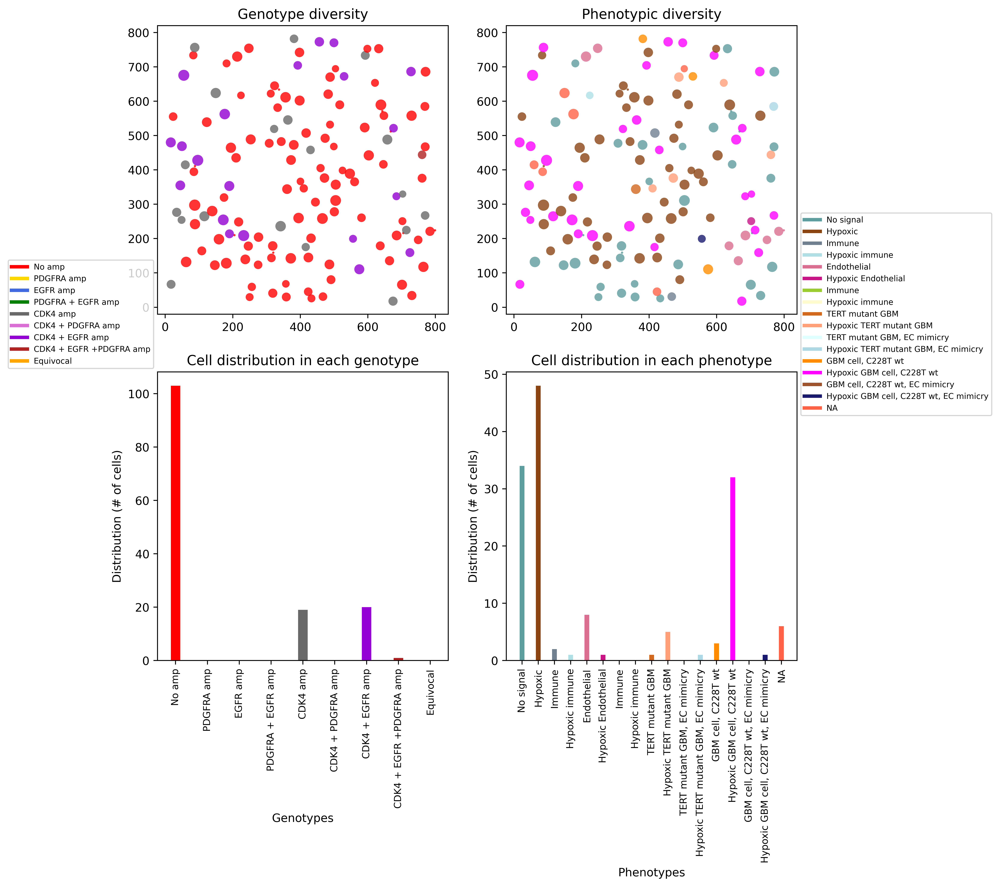

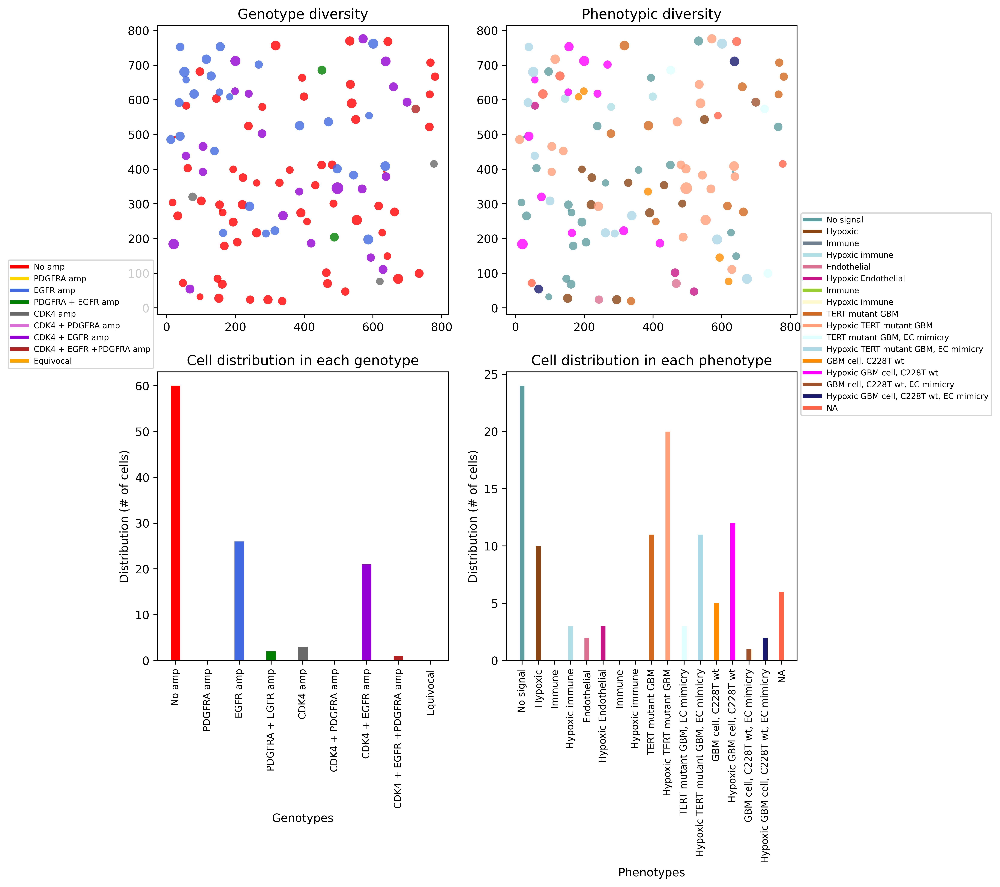

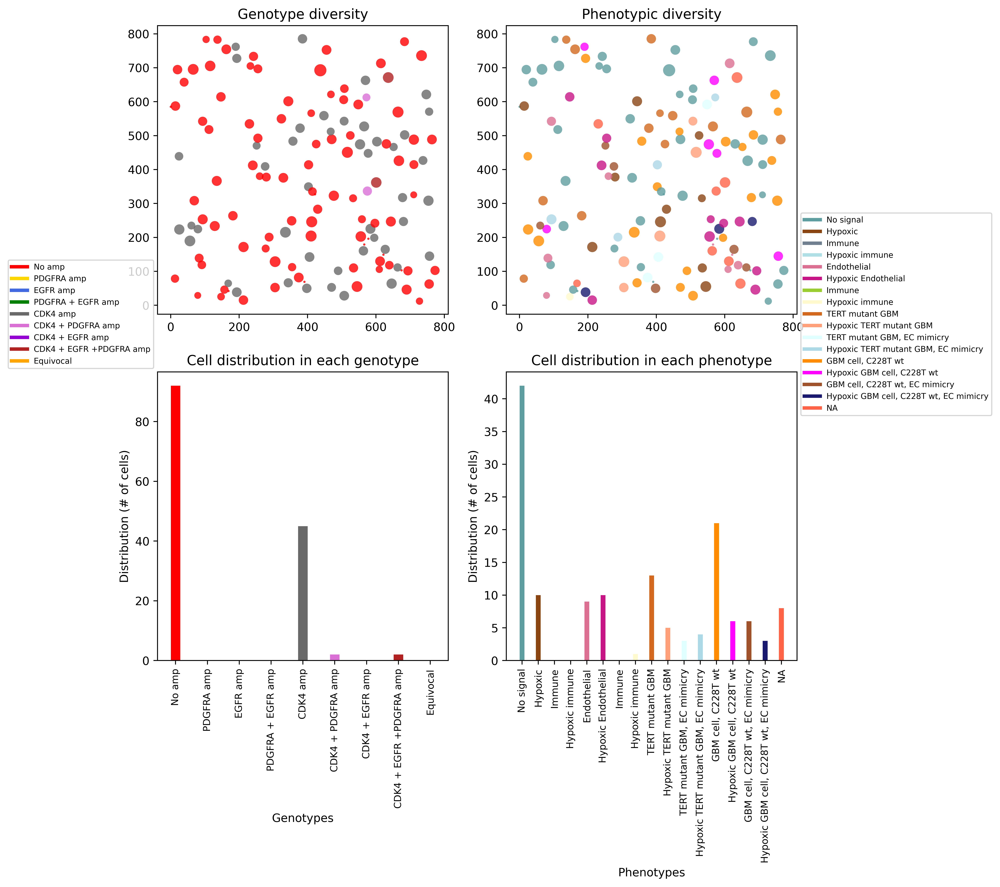

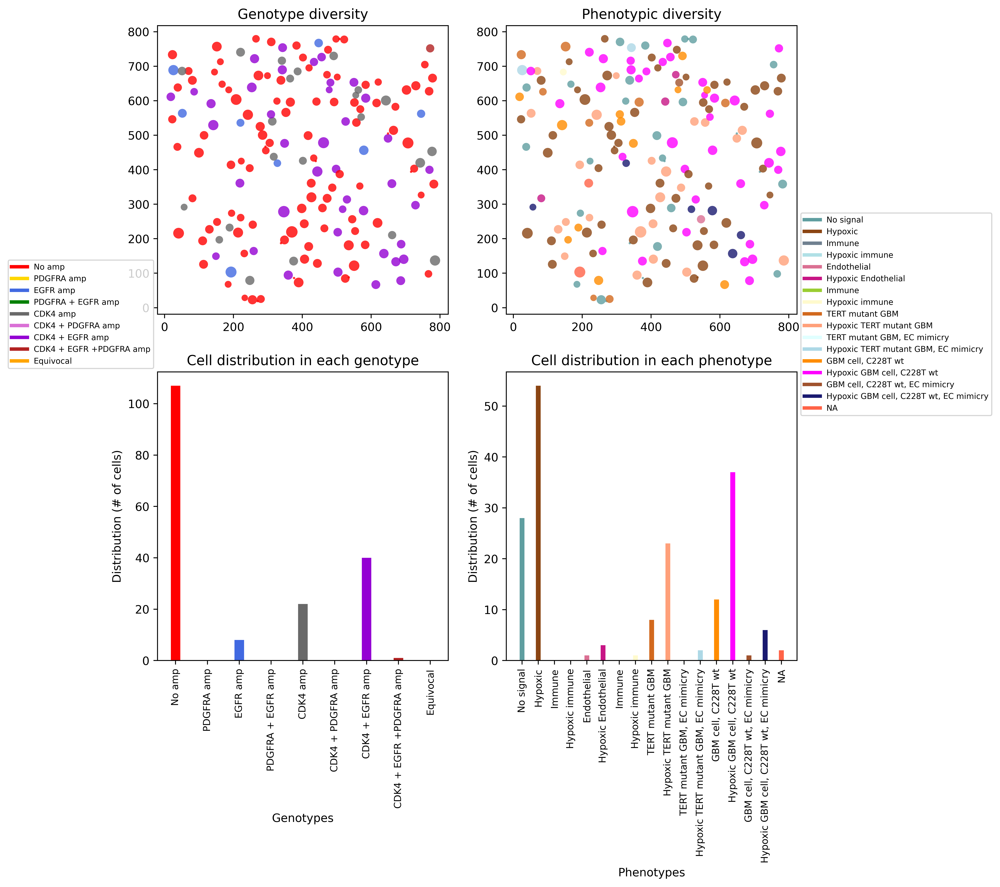

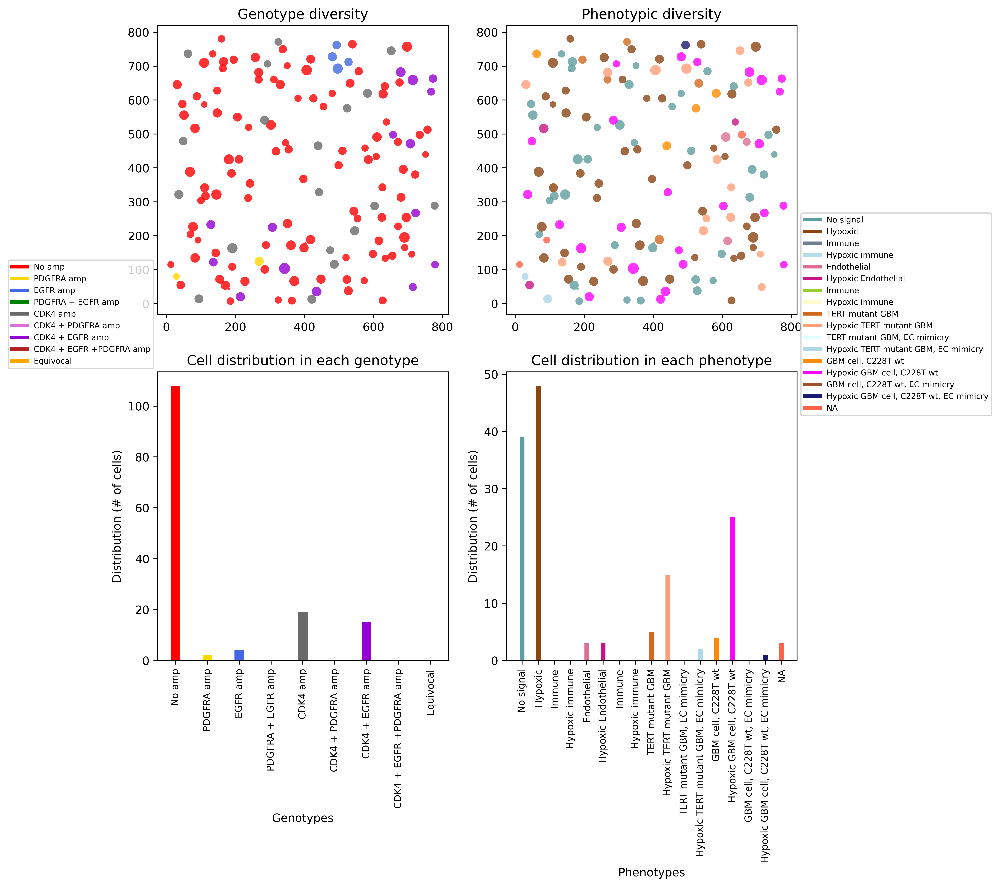

In [27]:
## merge geno and phenotypes 

## make it a subplot



colors = colours_30[0:9]
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='-') for c in colors]
labels = geno_labels

colors_p = colours_31[0:18]
lines_p = [Line2D([0], [0], color=c, linewidth=3, linestyle='-') for c in colors_p]
labels_p = pheno_labels

#im1 = [1]

for im in im_num:
    print(im)
    ii = np.int64(im)
    
    fig = plt.figure(figsize=(10,10),dpi=550)
    plt.title(name+'_'+str(ii))
    #for cells in range(count_im_num[np.int(im)-1]):
    #print(cells)
    s1 = np.where(np.array(count_matrix[:,0])==im)
    
    plt.subplot(2,2,1)
    geno_colr = np.array(geno_list)[s1]
    #color_s1 = colours_30
    area = np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4
    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colors)[geno_colr],
                s=area,linewidths=0,alpha=0.8)#, label= labels[s1])
    plt.axis('on')
    #plt.legend()
    colors = colours_30[0:9]
    lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='-') for c in colors]
    labels = geno_labels
    plt.legend(lines, labels,fontsize='x-small',loc='center right', bbox_to_anchor=(0,0))
    ###plt.legend(lines, labels,fontsize='x-small')
    plt.title('Genotype diversity')
    
    plt.subplot(2,2,3)
    #plt.hist(geno_colr)
    #plt.legend(lines, labels,fontsize='x-small')
    
    

  
    '''
    n , c= np.unique(geno_colr,return_counts=True)
    plt.bar(geno_labels, c, color =colors,width = 0.4)
    '''
    n , c= np.unique(geno_colr,return_counts=True)
    gn = np.zeros(len(geno_labels))
    for i,j in enumerate(n):
        #print(j)
        gn[j]=np.int64(c[i])
    gn = np.array(gn)
    #print(gn)  
    
    '''
    n, bins, patches = plt.hist(geno_colr, bins=len(colors))

    # adapt the color of each patch
    for c, p in zip(colors, patches):
        #p.set_facecolor(c)
        print(c)
    plt.legend(lines, labels,fontsize='x-small')
    '''
    
    X_axis = np.arange(len(geno_labels))
    X=y_marker = geno_labels
    plt.bar(X_axis, gn, 0.3, label = y_marker,color=colors)
    plt.xticks(X_axis, X,rotation=90,fontsize='small')
    plt.xlabel("Genotypes")
    plt.ylabel("Distribution (# of cells)")
    plt.title("Cell distribution in each genotype")
    #plt.legend(lines, labels,fontsize='x-small')
    #plt.legend(loc='upper right',fontsize='small')
    #plt.show()

    plt.subplot(2,2,2)
    pheno_colr = np.array(pheno_list)[s1]
    #color_s1 = colours_30
    #area = np.round(np.sqrt(count_matrix[ s1, 2]/np.pi),0)*4
    plt.scatter(count_matrix[ s1, 7], count_matrix[ s1, 8], color=np.array(colors_p)[pheno_colr],
                s=area,linewidths=0,alpha=0.8)# ,label= np.array(colours_30)[pheno_colr] )
    plt.axis('on')
    #plt.legend(lines_p, labels_p,fontsize='xx-small')
    plt.title('Phenotypic diversity')
    
    colors_p = colours_31[0:18]
    lines_p = [Line2D([0], [0], color=c, linewidth=3, linestyle='-') for c in colors_p]
    labels_p = pheno_labels
    plt.legend(lines_p, labels_p,fontsize='x-small',loc='center left', bbox_to_anchor=(1, 0))
    
    plt.subplot(2,2,4)
    n , c= np.unique(pheno_colr,return_counts=True)
    pn = np.zeros(len(pheno_labels))
    for i,j in enumerate(n):
        #print(j)
        pn[j]=np.int64(c[i])
    pn = np.array(pn)
    #print(pn)  
    
    X_axis = np.arange(len(pheno_labels))
    X=y_marker = pheno_labels
    plt.bar(X_axis, pn, 0.3, label = y_marker,color=colors_p)
    plt.xticks(X_axis, X,rotation=90,fontsize='small')
    plt.xlabel("Phenotypes")
    plt.ylabel("Distribution (# of cells)")
    plt.title("Cell distribution in each phenotype")
    #plt.legend(loc='upper right',fontsize='small')
    #plt.show()
    #plt.legend(lines_p, labels_p,fontsize='x-small',loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.savefig('geno_phenotype_'+str(ii)+'.png',bbox_inches='tight')
    

    